In [1]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from scipy.ndimage import gaussian_filter1d
from pandas import DataFrame, Series
import matplotlib.pylab as plt
import seaborn as sns 
import pandas as pd
import numpy as np
import datetime
import pyproj 
import os
import io

%matplotlib inline
np.set_printoptions(precision=3 , suppress= True)

In [2]:
#initial parameters - path
folder_path = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files'
file_path = os.path.join(folder_path, 'EGMS_L3_E44N25_100km_U.csv')
teste = pd.read_csv(file_path)

teste_reduced = teste.iloc[:,list(range(1, 4)) + list(range(11, 375))]
print(teste_reduced)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211029  20211104  20211110  \


In [3]:
#define the ETRS89-LAEA and the UTM projection
etrs89_laea = pyproj.CRS("EPSG:3035")
wgs84 = pyproj.CRS("EPSG:4326")
utm_32 = pyproj.CRS("EPSG:23032")

In [4]:
teste_new = teste_reduced.copy()

transformer = pyproj.Transformer.from_crs(etrs89_laea, wgs84)
teste_new["latitude"], teste_new["longitude"] = transformer.transform(teste_new["northing"].to_numpy(), teste_new["easting"].to_numpy())

print(teste_new)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211110  20211116  20211122  \


In [5]:
latitude_min = 46.095
latitude_max = 46.115
longitude_min = 12.075
longitude_max = 12.095

teste_area_selected = teste_new[((teste_new['latitude'] > latitude_min) & (teste_new['latitude'] < latitude_max) &
                  (teste_new['longitude'] > longitude_min) & (teste_new['longitude'] < longitude_max))]

print(teste_area_selected)

       easting  northing  height  20160105  20160111  20160117  20160123  \
67250  4482350   2557750   310.8       0.2       1.1       0.6       0.2   
67251  4482650   2557750   318.2      -0.9      -0.4       0.4       1.1   
67252  4482550   2557750   314.0       2.8       2.5       2.0      -1.4   
67254  4482850   2557750   316.5       0.3       0.3       0.1       0.1   
67255  4481950   2557750   304.7      -0.5      -0.8      -0.2      -0.1   
...        ...       ...     ...       ...       ...       ...       ...   
68435  4483150   2556450   305.9      -0.7       0.0       0.2       0.2   
68439  4483050   2556450   304.6       0.7       0.5       1.0       0.5   
68857  4482050   2555850   295.1      -0.3       0.1       0.4       0.4   
68858  4482550   2555850   299.4      -1.8      -0.3       0.6       0.8   
68859  4482150   2555850   296.4       0.0       0.1       0.4       1.2   

       20160129  20160204  20160210  ...  20211110  20211116  20211122  \
67250       0

In [6]:
def selec_points(indice_number):
    teste_point = teste_area_selected.iloc[indice_number, 3:367]
    teste_point.index = pd.to_datetime(teste_point.index, format='%Y%m%d')
    points_dataframe = pd.DataFrame(teste_point, columns=[teste_point.name])
    return points_dataframe
    
indicies = [0, 2, 4, 6, 8, 10, 15,
            12, 14, 16, 18, 20, 25,
            22, 24, 26, 28, 30, 35,
            32, 34, 36, 38, 40, 45,
            42, 44, 46, 48, 50, 45,
            52, 54, 56, 58, 60, 55,
            62, 64, 66, 68, 70, 65,
            72, 74, 76, 78, 80, 75]
points_dictionaire = {}

for indice_number in indicies:
    points_dataframe = selec_points(indice_number)
    points_dictionaire[indice_number] = points_dataframe

print(points_dictionaire)

{0:             67250
2016-01-05    0.2
2016-01-11    1.1
2016-01-17    0.6
2016-01-23    0.2
2016-01-29    0.6
...           ...
2021-11-28    3.9
2021-12-04    3.3
2021-12-10    0.8
2021-12-16    2.9
2021-12-22    1.6

[364 rows x 1 columns], 2:             67252
2016-01-05    2.8
2016-01-11    2.5
2016-01-17    2.0
2016-01-23   -1.4
2016-01-29   -1.3
...           ...
2021-11-28    0.9
2021-12-04   -0.8
2021-12-10    3.5
2021-12-16    0.9
2021-12-22   -1.7

[364 rows x 1 columns], 4:             67255
2016-01-05   -0.5
2016-01-11   -0.8
2016-01-17   -0.2
2016-01-23   -0.1
2016-01-29   -0.3
...           ...
2021-11-28    5.0
2021-12-04    3.5
2021-12-10    2.9
2021-12-16   10.0
2021-12-22    7.3

[364 rows x 1 columns], 6:             67257
2016-01-05   -0.4
2016-01-11   -2.3
2016-01-17   -0.5
2016-01-23    0.3
2016-01-29   -1.0
...           ...
2021-11-28  -10.7
2021-12-04   -8.9
2021-12-10  -10.1
2021-12-16   -5.7
2021-12-22   -3.8

[364 rows x 1 columns], 8:             67259
20

In [7]:
print(len(indicies))

49


In [10]:
def linear_detrend(column_name, indice_data):
 
    #getting the linear model to substract from the original time series:    
    x = np.arange(len(indice_data)).reshape(-1, 1)
    y = indice_data.values.reshape(-1, 1)
    
    linear_model = LinearRegression().fit(x, y)
    regression_line = linear_model.predict(x)
    
    detrended_values = y.flatten() - regression_line.flatten()
    #detrended_values = station_data[f'{station_name}_east(m)'].values - regression_line.flatten()
    
    detrended_dataframe = pd.DataFrame(
        detrended_values, 
        index=indice_data.index, 
        columns=[f'{column_name}_up(mm)_detrended'])
        
    return detrended_dataframe


#dictionaries to store the data
detrended_data_dict = {}

#calling the function
for indice_number, indice_data in points_dictionaire.items():
    
    column_name = indice_data.columns[0]
    detrended_dataframe = linear_detrend(
        column_name, 
        indice_data)
    detrended_data_dict[column_name] = detrended_dataframe
    

#printing dataframe
#stations detrended
for indice_number, indice_data in detrended_data_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

67250: 
            67250_up(mm)_detrended
2016-01-05               -0.917272
2016-01-11               -0.026466
2016-01-17               -0.535660
2016-01-23               -0.944854
2016-01-29               -0.554048
...                            ...
2021-11-28               -0.517930
2021-12-04               -1.127124
2021-12-10               -3.636318
2021-12-16               -1.545512
2021-12-22               -2.854706

[364 rows x 1 columns]

67252: 
            67252_up(mm)_detrended
2016-01-05                2.388499
2016-01-11                2.087847
2016-01-17                1.587194
2016-01-23               -1.813459
2016-01-29               -1.714111
...                            ...
2021-11-28                0.254221
2021-12-04               -1.446432
2021-12-10                2.852916
2021-12-16                0.252263
2021-12-22               -2.348389

[364 rows x 1 columns]

67255: 
            67255_up(mm)_detrended
2016-01-05               -0.778139
2016-01-11      

In [11]:
def remove_outliers(indice_number, indice_data):
    limiar_z = 3.0
    
    
    selecting_outliers = indice_data[(np.abs(indice_data-indice_data.mean()) 
                                              < limiar_z*indice_data.std())]
    
    
    outliers_removed_dataframe = pd.DataFrame(selecting_outliers, 
                                              index=indice_data.index)
    
    outliers_removed_dataframe = outliers_removed_dataframe.rename(
        columns={f'{indice_number}_up(mm)_detrended':f'{indice_number}_up(mm)'})  
    
    outliers_removed_dataframe.dropna(inplace=True)
    
    return outliers_removed_dataframe

#dictionaries to store the data
area_outliers_removed_dict = {}

#calling the function
for indice_number, indice_data in detrended_data_dict.items():
    outliers_removed_dataframe = remove_outliers(
        indice_number, 
        indice_data)
    area_outliers_removed_dict[indice_number] = outliers_removed_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in area_outliers_removed_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

67250: 
            67250_up(mm)
2016-01-05     -0.917272
2016-01-11     -0.026466
2016-01-17     -0.535660
2016-01-23     -0.944854
2016-01-29     -0.554048
...                  ...
2021-11-22     -1.408736
2021-11-28     -0.517930
2021-12-04     -1.127124
2021-12-16     -1.545512
2021-12-22     -2.854706

[363 rows x 1 columns]

67252: 
            67252_up(mm)
2016-01-05      2.388499
2016-01-11      2.087847
2016-01-17      1.587194
2016-01-23     -1.813459
2016-01-29     -1.714111
...                  ...
2021-11-28      0.254221
2021-12-04     -1.446432
2021-12-10      2.852916
2021-12-16      0.252263
2021-12-22     -2.348389

[364 rows x 1 columns]

67255: 
            67255_up(mm)
2016-01-05     -0.778139
2016-01-11     -1.089114
2016-01-17     -0.500089
2016-01-23     -0.411064
2016-01-29     -0.622038
...                  ...
2021-11-22      0.792903
2021-11-28      0.781928
2021-12-04     -0.729046
2021-12-10     -1.340021
2021-12-22      3.038030

[359 rows x 1 columns]

6

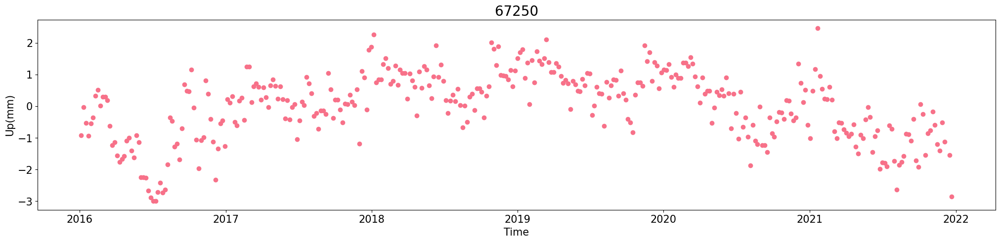

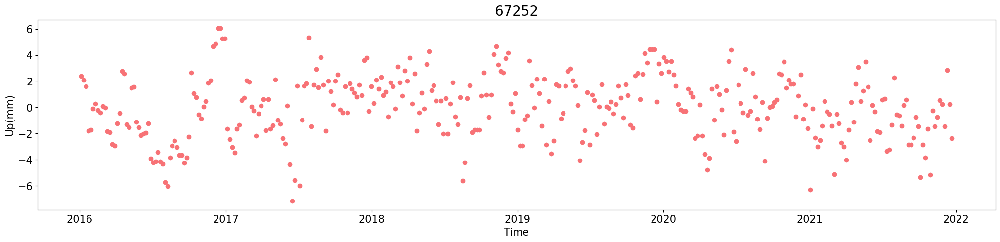

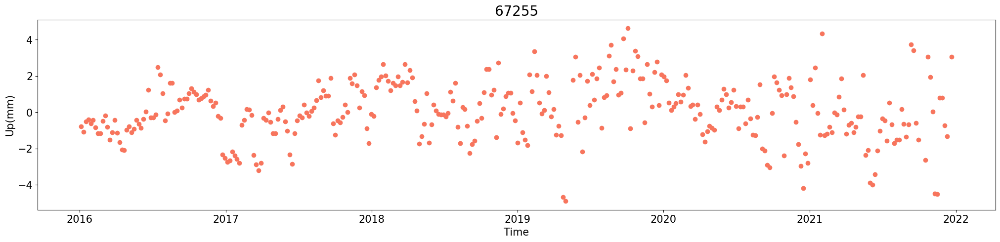

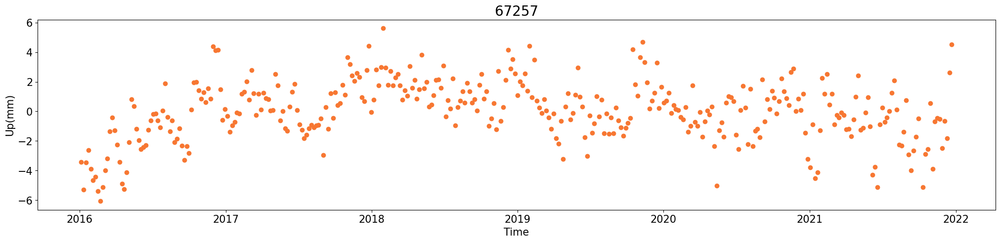

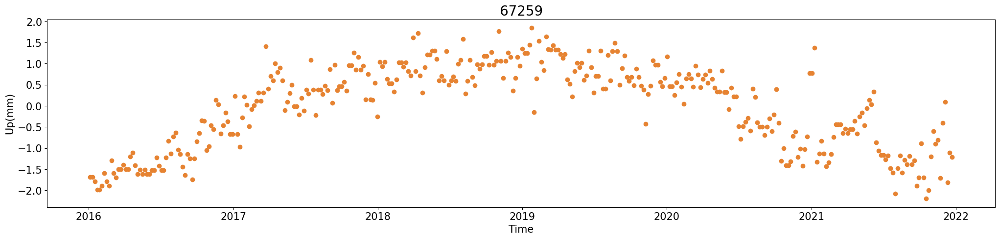

...

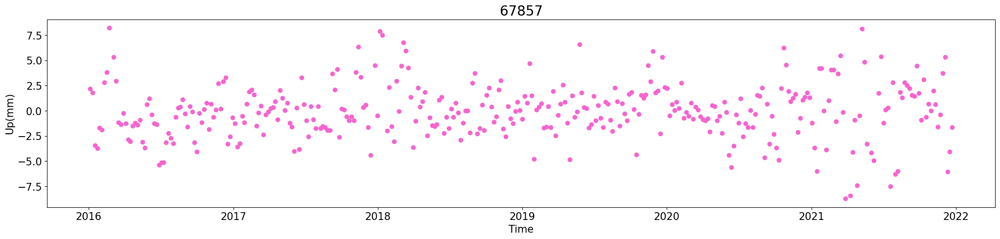

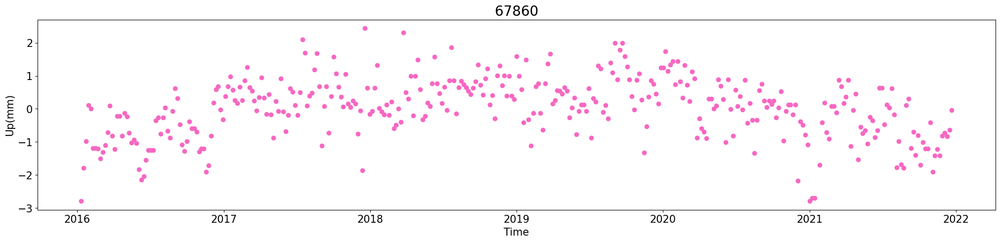

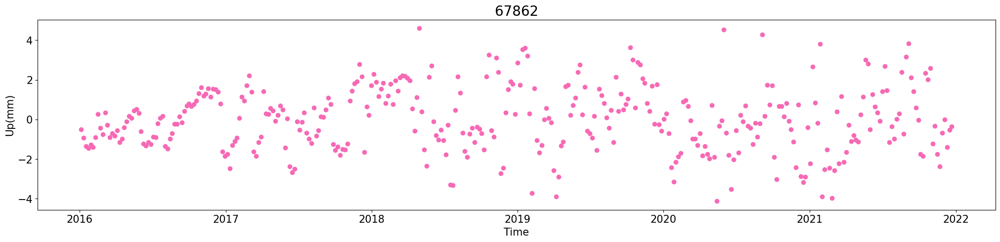

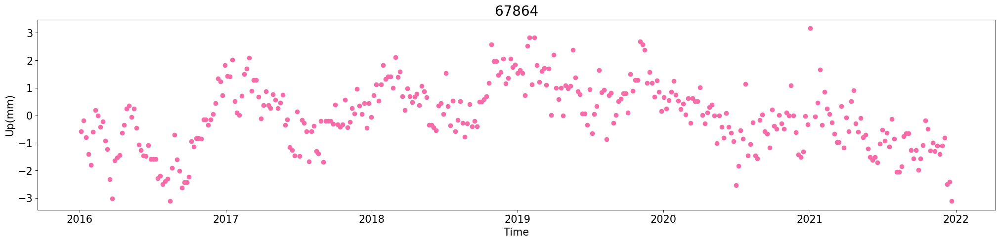

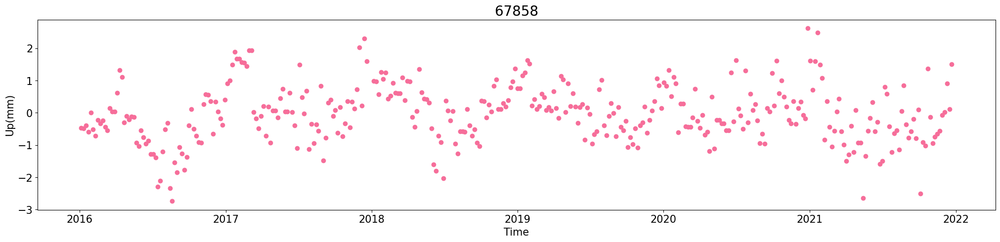

In [12]:
#checking the areas's plots - brse detrended

colors = sns.color_palette("husl", len(area_outliers_removed_dict))
#folder = ''

for i, (indice_number, indice_data) in enumerate(area_outliers_removed_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    #fl = os.path.join(folder, f'{indice_number}.svg')
    #f = io.BytesIO()
    #plt.savefig(fl, format="svg")

    plt.show()

In [13]:
def get_rolling_mean(indice_number, indice_data):
    
    area_rolling_mean = indice_data.rolling(2, min_periods=1).mean()
    
    areas_rolling_mean_dataframe = pd.DataFrame(area_rolling_mean, 
                                              index=indice_data.index)
    
    areas_rolling_mean_dataframe = areas_rolling_mean_dataframe.rename(
        columns={f'{indice_number}_up(mm)':f'{indice_number}_up(mm)_rm'})
    
    areas_rolling_mean_dataframe.dropna(inplace=True)
    
    return areas_rolling_mean_dataframe

#dictionaries to store the data
areas_rolling_mean_dict = {}

#calling the function
for indice_number, indice_data in area_outliers_removed_dict.items():
    areas_rolling_mean_dataframe = get_rolling_mean(indice_number, indice_data)
    areas_rolling_mean_dict[indice_number] = areas_rolling_mean_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in areas_rolling_mean_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

67250: 
            67250_up(mm)_rm
2016-01-05        -0.917272
2016-01-11        -0.471869
2016-01-17        -0.281063
2016-01-23        -0.740257
2016-01-29        -0.749451
...                     ...
2021-11-22        -1.304139
2021-11-28        -0.963333
2021-12-04        -0.822527
2021-12-16        -1.336318
2021-12-22        -2.200109

[363 rows x 1 columns]

67252: 
            67252_up(mm)_rm
2016-01-05         2.388499
2016-01-11         2.238173
2016-01-17         1.837520
2016-01-23        -0.113132
2016-01-29        -1.763785
...                     ...
2021-11-28         0.404547
2021-12-04        -0.596105
2021-12-10         0.703242
2021-12-16         1.552590
2021-12-22        -1.048063

[364 rows x 1 columns]

67255: 
            67255_up(mm)_rm
2016-01-05        -0.778139
2016-01-11        -0.933627
2016-01-17        -0.794602
2016-01-23        -0.455576
2016-01-29        -0.516551
...                     ...
2021-11-22        -1.851609
2021-11-28         0.787416
20

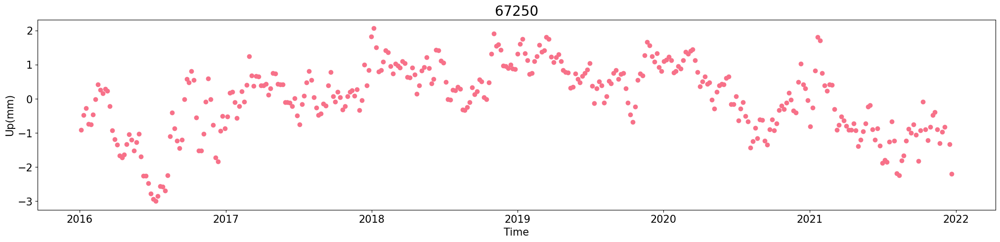

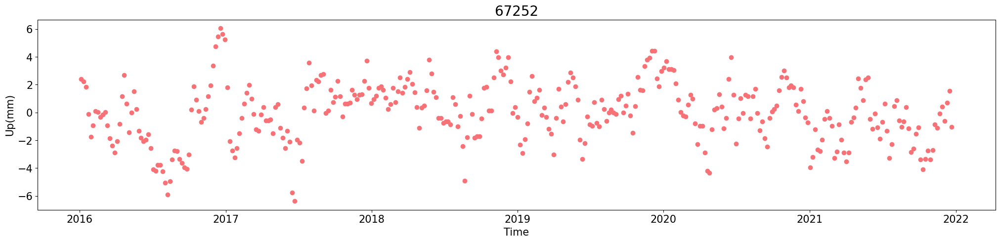

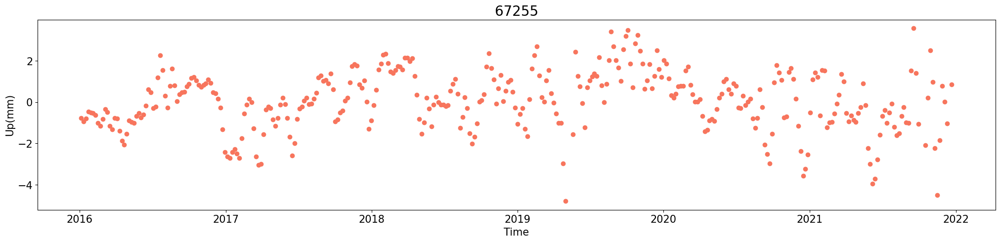

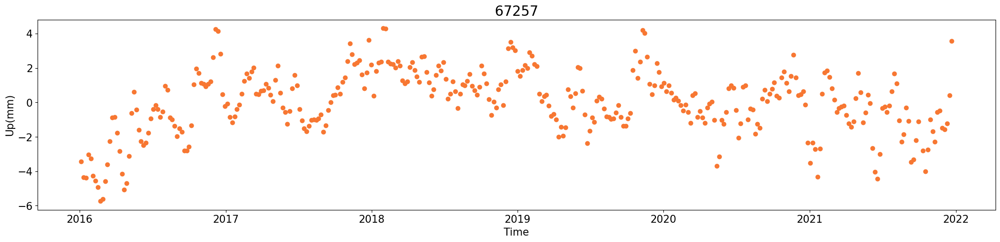

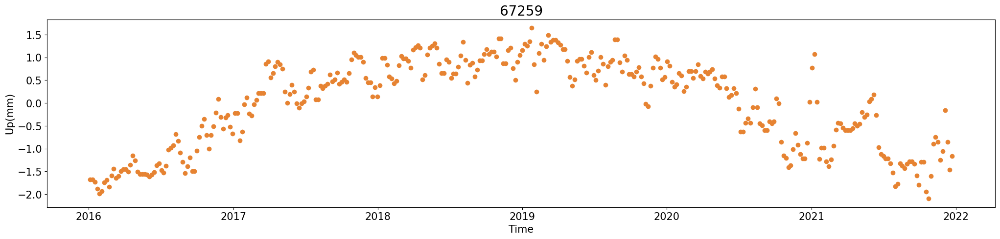

...

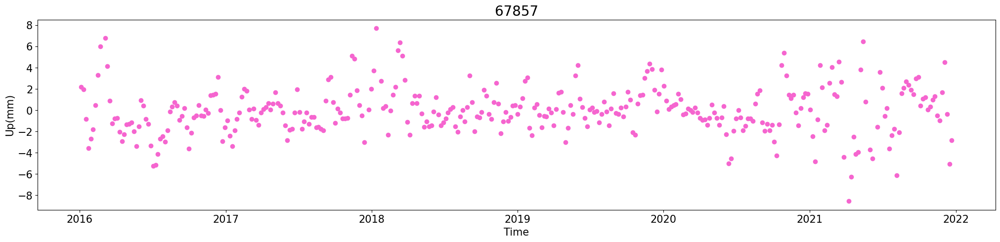

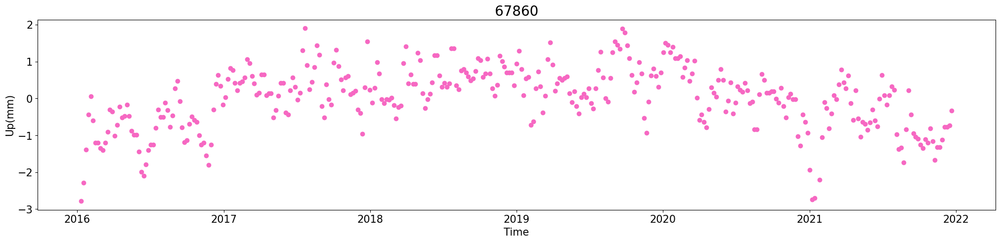

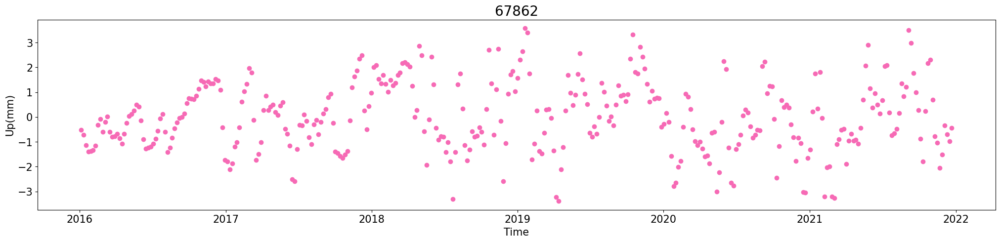

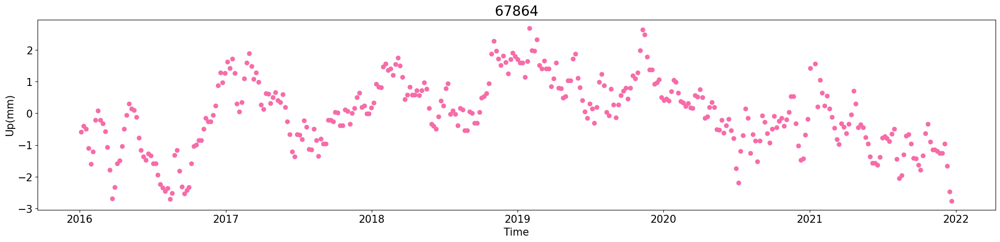

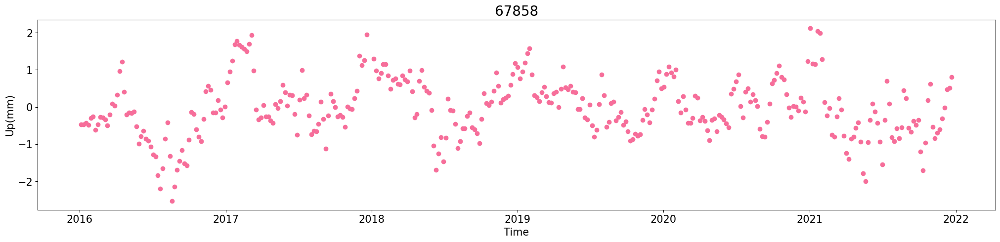

In [23]:
#checking the areas's plots - rolling mean

colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_rolling_mean/up'

for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    fl = os.path.join(folder, f'{indice_number}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")

    plt.show()

In [15]:
target_index = 68034
closest_data = teste_area_selected.loc[target_index]
print(closest_data)

easting      4.483150e+06
northing     2.556550e+06
height       3.090000e+02
20160105    -6.000000e-01
20160111     3.000000e-01
                 ...     
20211210     3.200000e+00
20211216     5.200000e+00
20211222     1.900000e+00
latitude     4.610141e+01
longitude    1.209486e+01
Name: 68034, Length: 369, dtype: float64


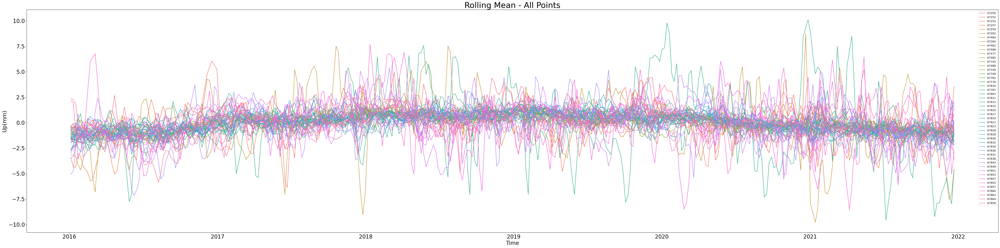

In [16]:
#checking all point together:

colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
#folder = ''

plt.figure(figsize=(65, 15))

for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    plt.plot(indice_data.index, indice_data, label = f'{indice_number}', color=colors[i], lw=1.5)

plt.title('Rolling Mean - All Points', fontsize=30)
plt.xlabel('Time', fontsize=20)
plt.xticks(fontsize=20)
plt.ylabel('Up(mm)', fontsize=20)
plt.yticks(fontsize=20)
#plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-10-15'))
plt.legend()

#fl = os.path.join(folder, 'rm_all_points_EAST.svg')
#plt.savefig(fl, format="svg")

plt.show()

In [17]:
#getting the average for all points rolling mean
all_rm_data = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    all_rm_data[indice_number] = indice_data.squeeze()
    
avg_rm = all_rm_data.mean(axis=1).rolling(2, min_periods=1).mean()
print(avg_rm)

2016-01-05   -1.372165
2016-01-11   -1.392560
2016-01-17   -1.339912
2016-01-23   -1.217329
2016-01-29   -1.218250
                ...   
2021-11-22   -1.221694
2021-11-28   -1.229889
2021-12-04   -1.162239
2021-12-16   -1.151547
2021-12-22   -1.083135
Length: 363, dtype: float64


In [18]:
#removing the average rolling mean from each point
points_avgrm_reduced = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    points_avgrm_reduced[indice_number] = indice_data[f'{indice_number}_up(mm)_rm'] - avg_rm
    
points_avgrm_reduced = points_avgrm_reduced.dropna(axis=0)

print(points_avgrm_reduced)

               67250     67252     67255     67257     67259     67262  \
2016-01-11  0.920691  3.630733  0.458933 -2.965709 -0.289559  0.350015   
2016-01-17  1.058849  3.177433  0.545311 -3.037045 -0.393671  1.045505   
2016-01-23  0.477072  1.104197  0.761753 -1.828317 -0.667717  1.621059   
2016-01-29  0.468798 -0.545535  0.701699 -2.046086 -0.768260  1.270117   
2016-02-04  0.857920  0.402128  0.789040 -2.966458 -0.621407  0.816571   
...              ...       ...       ...       ...       ...       ...   
2021-10-23 -0.271889 -1.805258  1.139544 -1.800432 -1.160924  0.538110   
2021-10-29 -0.002965 -2.577792  3.306687 -0.191003 -0.784269  0.864365   
2021-11-04  0.350741 -1.865545  1.808612 -0.846792 -0.072833  0.825402   
2021-11-10  0.563301  0.105556 -1.280609 -1.343727  0.197458  1.095294   
2021-11-22 -0.082444  1.126894 -0.629915  0.741539 -0.032826  0.114211   

               67464     67264     67462     67468  ...     67849     67851  \
2016-01-11 -0.221421 -1.787747  

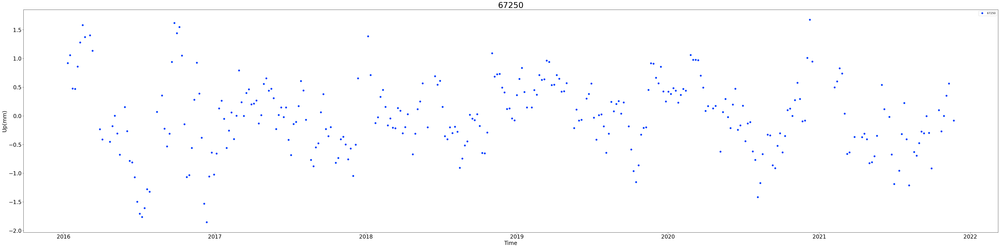

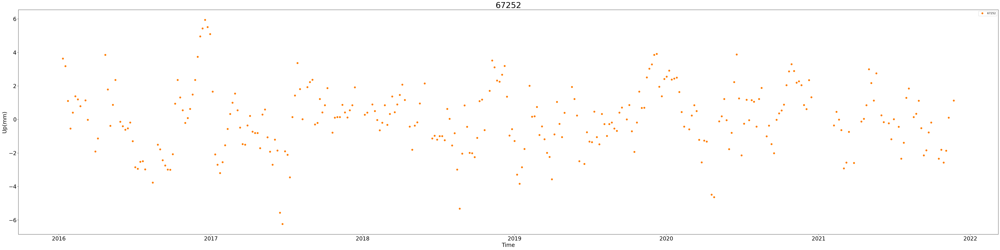

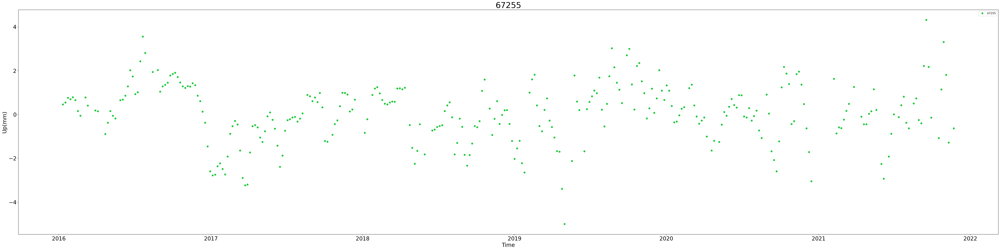

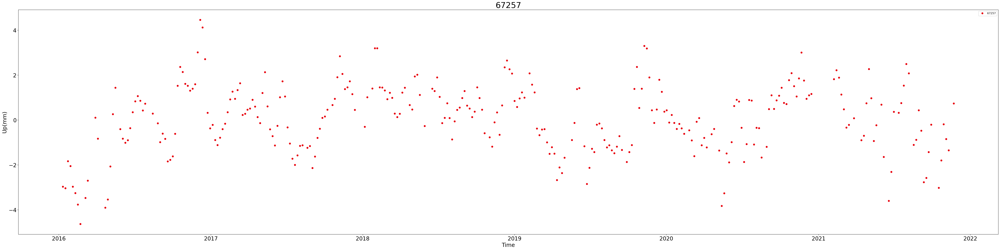

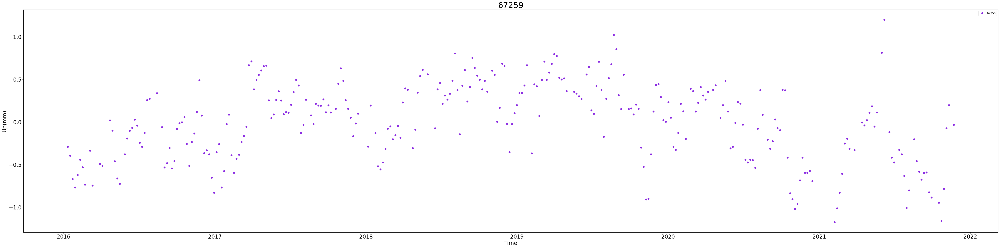

...

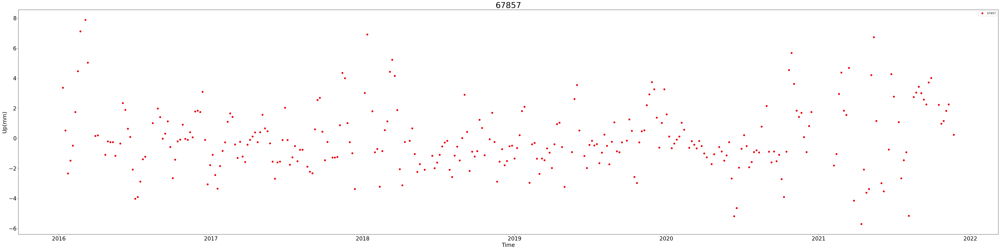

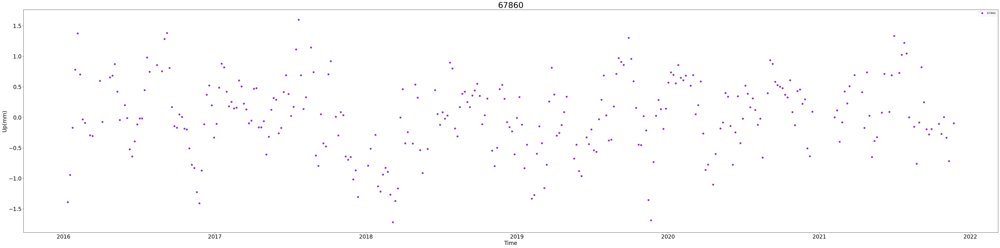

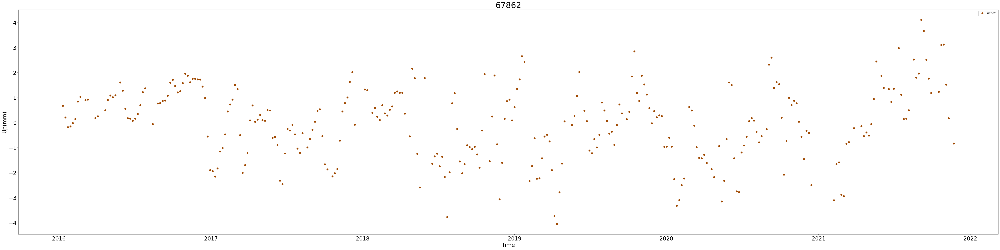

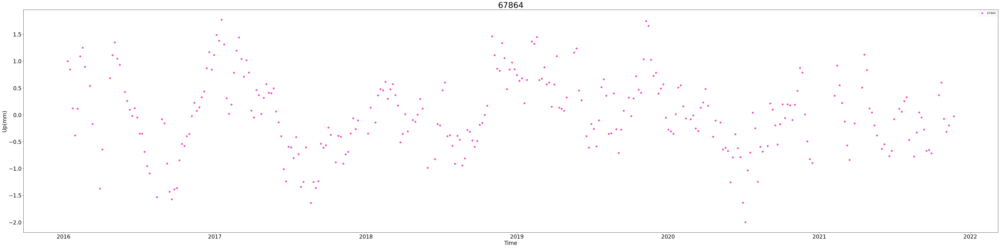

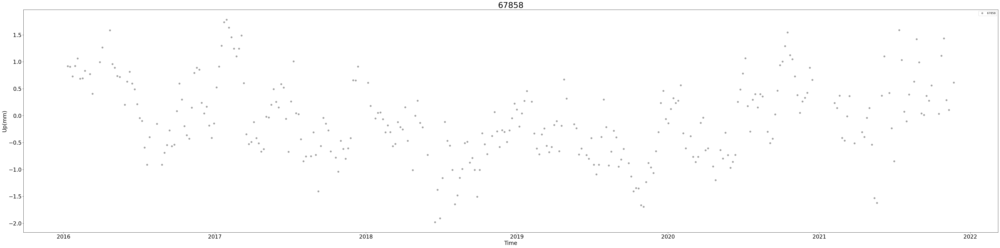

In [22]:
#checking the points plots - AFTER the reduction

colors = sns.color_palette("bright", len(points_avgrm_reduced))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_after_avg_rolling_mean/up'

for i, (column, color) in enumerate(zip(points_avgrm_reduced.columns, colors)):
    plt.figure(figsize=(65, 15))
    plt.plot(points_avgrm_reduced.index, points_avgrm_reduced[column], 'o', color=color, lw=2, label=column) 
    
    plt.title(f'{column}', fontsize = 30)
    plt.xlabel('Time', fontsize = 20)
    plt.xticks(fontsize=20)
    plt.ylabel('Up(mm)', fontsize = 20)                                       
    plt.yticks(fontsize=20)
    #plt.ylim(-0.008,0.008)
    #plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-07-15'))

    plt.legend()
    
    fl = os.path.join(folder, f'{column}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")
    
    plt.show()